In [ ]:
#Source: Reinforcement Learning Basics - https://github.com/tirthajyoti/RL_basics/blob/master/MDP_VI_PI_Q-learning_AIMA.ipynb


In [ ]:
pip install mdptoolbox-hiive

In [ ]:
pip install gym

In [133]:
import random, time
import numpy as np
from collections import defaultdict
import operator
import matplotlib.pyplot as plt
import pandas as pd
from seaborn import heatmap
import gym
from gym import wrappers
import matplotlib.pyplot as plt
import numpy as np
import time
import sys
import mdptoolbox, mdptoolbox.example
import hiive.mdptoolbox.mdp,hiive.mdptoolbox.example
import ipywidgets as widgets
from IPython.display import display

In [80]:
orientations = EAST, NORTH, WEST, SOUTH = [(1, 0), (0, 1), (-1, 0), (0, -1)]
turns = LEFT, RIGHT = (+1, -1)

In [81]:
def turn_heading(heading, inc, headings=orientations):
    return headings[(headings.index(heading) + inc) % len(headings)]


def turn_right(heading):
    return turn_heading(heading, RIGHT)

def turn_left(heading):
    return turn_heading(heading, LEFT)

def distance(a, b):
    """The distance between two (x, y) points."""
    xA, yA = a
    xB, yB = b
    return math.hypot((xA - xB), (yA - yB))

In [82]:
class MDP:
    """A Markov Decision Process, defined by an initial state, transition model,
    and reward function. We also keep track of a gamma value, for use by
    algorithms. The transition model is represented somewhat differently from
    the text. Instead of P(s' | s, a) being a probability number for each
    state/state/action triplet, we instead have T(s, a) return a
    list of (p, s') pairs. We also keep track of the possible states,
    terminal states, and actions for each state."""

    def __init__(self, init, actlist, terminals, transitions = {}, reward = None, states=None, gamma=.9):
        if not (0 < gamma <= 1):
            raise ValueError("An MDP must have 0 < gamma <= 1")

        if states:
            self.states = states
        else:
            ## collect states from transitions table
            self.states = self.get_states_from_transitions(transitions)
            
        
        self.init = init
        
        if isinstance(actlist, list):
            ## if actlist is a list, all states have the same actions
            self.actlist = actlist
        elif isinstance(actlist, dict):
            ## if actlist is a dict, different actions for each state
            self.actlist = actlist
        
        self.terminals = terminals
        self.transitions = transitions
        if self.transitions == {}:
            print("Warning: Transition table is empty.")
        self.gamma = gamma
        if reward:
            self.reward = reward
        else:
            self.reward = {s : 0 for s in self.states}
        #self.check_consistency()

    def R(self, state):
        """Return a numeric reward for this state."""
        return self.reward[state]

    def T(self, state, action):
        """Transition model. From a state and an action, return a list
        of (probability, result-state) pairs."""
        if(self.transitions == {}):
            raise ValueError("Transition model is missing")
        else:
            return self.transitions[state][action]

    def actions(self, state):
        """Set of actions that can be performed in this state. By default, a
        fixed list of actions, except for terminal states. Override this
        method if you need to specialize by state."""
        if state in self.terminals:
            return [None]
        else:
            return self.actlist

    def get_states_from_transitions(self, transitions):
        if isinstance(transitions, dict):
            s1 = set(transitions.keys())
            s2 = set([tr[1] for actions in transitions.values() 
                              for effects in actions.values() for tr in effects])
            return s1.union(s2)
        else:
            print('Could not retrieve states from transitions')
            return None

    def check_consistency(self):
        # check that all states in transitions are valid
        assert set(self.states) == self.get_states_from_transitions(self.transitions)
        # check that init is a valid state
        assert self.init in self.states
        # check reward for each state
        #assert set(self.reward.keys()) == set(self.states)
        assert set(self.reward.keys()) == set(self.states)
        # check that all terminals are valid states
        assert all([t in self.states for t in self.terminals])
        # check that probability distributions for all actions sum to 1
        for s1, actions in self.transitions.items():
            for a in actions.keys():
                s = 0
                for o in actions[a]:
                    s += o[0]
                assert abs(s - 1) < 0.001

In [83]:
class GridMDP(MDP):

    """A two-dimensional grid MDP, as in [Figure 17.1]. All you have to do is
    specify the grid as a list of lists of rewards; use None for an obstacle
    (unreachable state). Also, you should specify the terminal states.
    An action is an (x, y) unit vector; e.g. (1, 0) means move east."""

    def __init__(self, grid, terminals, init=(0, 0), gamma=.9):
        grid.reverse()  # because we want row 0 on bottom, not on top
        reward = {}
        states = set()
        self.rows = len(grid)
        self.cols = len(grid[0])
        self.grid = grid
        for x in range(self.cols):
            for y in range(self.rows):
                if grid[y][x] is not None:
                    states.add((x, y))
                    reward[(x, y)] = grid[y][x]
        self.states = states
        actlist = orientations
        transitions = {}
        for s in states:
            transitions[s] = {}
            for a in actlist:
                transitions[s][a] = self.calculate_T(s, a)
        MDP.__init__(self, init, actlist=actlist,
                     terminals=terminals, transitions = transitions, 
                     reward = reward, states = states, gamma=gamma)

    def calculate_T(self, state, action):
        if action is None:
            return [(0.0, state)]
        else:
            return [(0.8, self.go(state, action)),
                    (0.1, self.go(state, turn_right(action))),
                    (0.1, self.go(state, turn_left(action)))]
    
    def T(self, state, action):
        if action is None:
            return [(0.0, state)]
        else:
            return self.transitions[state][action]
 
    def go(self, state, direction):
        """Return the state that results from going in this direction."""
        state1 = vector_add(state, direction)
        return state1 if state1 in self.states else state

    def to_grid(self, mapping):
        """Convert a mapping from (x, y) to v into a [[..., v, ...]] grid."""
        return list(reversed([[mapping.get((x, y), None)
                               for x in range(self.cols)]
                              for y in range(self.rows)]))

    def to_arrows(self, policy):
        chars = {
            (1, 0): '→', (0, 1): '↑', (-1, 0): '←', (0, -1): '↓', None: 'TERMINAL'}
        return self.to_grid({s: chars[a] for (s, a) in policy.items()})

In [84]:
def vector_add(a, b):
    """Component-wise addition of two vectors."""
    return tuple(map(operator.add, a, b))

In [283]:
def gen_mdp(nrows=3,ncols=4,terminals = [(3,2),(3,1)],main_reward = -0.04,
            terminal_rewards = [1,-1],block_coords = []):
    """
    Generates a list of list to feed to the main GridMDP class from simple user API
    nrows: Number of rows
    ncols: Number of columns
    terminals: Coordinates of terminal points, list of tuples
    main_reward: The default reward for traversing the grid world
    block_coords: Coordinates of solid blocks, list of tules
    """
    
    x = [[main_reward] * ncols for i in range(nrows)]
    for i,t in enumerate(terminals):
        x[t[1]][t[0]]=terminal_rewards[i]
    for b in block_coords:
        x[b[1]][b[0]]=None
    x.reverse()
       
    return x

In [284]:
grid_terminals = [(3, 3), (1,1), (3,1), (3,2), (0,3)]

In [285]:
#grid_1= GridMDP(grid_rewards,grid_terminals,gamma=0.95)
large_grid = gen_mdp(nrows=25,ncols=25,terminals=[(3, 3), (1,1), (3,1), (3,2), (0,3)],main_reward=-0.01,
                     terminal_rewards=[10,-1,-1,-1,-1])


In [286]:
#large_gridworld = GridMDP(large_grid,terminals=[(3, 3), (1,1), (3,1), (3,2), (0,3)])
largeGrid= GridMDP(large_grid,terminals=[(3, 3), (1,1), (3,1), (3,2), (0,3)],gamma=0.9)

In [287]:
largeGrid.grid

[[-0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01],
 [-0.01,
  -1,
  -0.01,
  -1,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01],
 [-0.01,
  -0.01,
  -0.01,
  -1,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01],
 [-1,
  -0.01,
  -0.01,
  10,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01],
 [-0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -0.01,
  -

In [288]:
len(largeGrid.states)

625

## Value It

In [289]:
np.array(largeGrid.grid).shape

(25, 25)

In [246]:
def value_iteration(mdp, epsilon=0.001):
    """Solving an MDP by value iteration.
    mdp: The MDP object
    epsilon: Stopping criteria
    """
    U1 = {s: 0 for s in mdp.states}
    R, T, gamma = mdp.R, mdp.T, mdp.gamma
    iter_count=0
    while True:
        iter_count+=1
        U = U1.copy()
        delta = 0
        for s in mdp.states:
            U1[s] = R(s) + gamma * max([sum([p * U[s1] for (p, s1) in T(s, a)])
                                        for a in mdp.actions(s)])
            delta = max(delta, abs(U1[s] - U[s]))
        if delta < epsilon * (1 - gamma) / gamma:
            return (U,iter_count)

In [247]:
def value_iteration_over_time(mdp, iterations=50):
    U_over_time = []
    U1 = {s: 0 for s in mdp.states}
    R, T, gamma = mdp.R, mdp.T, mdp.gamma
    for _ in range(iterations):
        U = U1.copy()
        for s in mdp.states:
            U1[s] = R(s) + gamma * max([sum([p * U[s1] for (p, s1) in T(s, a)])
                                        for a in mdp.actions(s)])
        U_over_time.append(U)
    return U_over_time

In [248]:
def plot_value_update(mdp,iterations=10):
    """
    Plot value updates over iterations for a given MDP.
    """
    x = value_iteration_over_time(mdp,iterations=iterations)
    value_states = {k:[] for k in mdp.states}
    for i in x:
        for k,v in i.items():
            value_states[k].append(v)
    plt.figure(figsize=(8,5))
    for v in value_states:
        plt.plot(value_states[v])
        plt.legend(list(value_states.keys()),fontsize=14)
    plt.grid(True)
    plt.xlabel("Iterations",fontsize=14)
    plt.ylabel("Utilities of states",fontsize=14)
    plt.show()

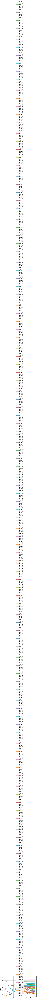

In [241]:
plot_value_update(largeGrid,15)

In [290]:
## Determining best policy
def best_policy(mdp, U):
    """Given an MDP and a utility function U, determine the best policy,
    as a mapping from state to action."""

    pi = {}
    for s in mdp.states:
        pi[s] = max(mdp.actions(s), key=lambda a: expected_utility(a, s, U, mdp))
    return pi

In [291]:
## visualization

def value_iteration_instru(mdp, iterations=20):
    U_over_time = []
    U1 = {s: 0 for s in mdp.states}
    R, T, gamma = mdp.R, mdp.T, mdp.gamma
    for _ in range(iterations):
        U = U1.copy()
        for s in mdp.states:
            U1[s] = R(s) + gamma * max([sum([p * U[s1] for (p, s1) in T(s, a)])
                                        for a in mdp.actions(s)])
        U_over_time.append(U)
    return U_over_time

In [292]:
columns = 25
rows = 25
U_over_time = value_iteration_instru(largeGrid,iterations=100)

In [293]:
def make_plot_grid_step_function(columns, rows, U_over_time):
    """ipywidgets interactive function supports single parameter as input.
    This function creates and return such a function by taking as input
    other parameters."""

    def plot_grid_step(iteration):
        data = U_over_time[iteration]
        data = defaultdict(lambda: 0, data)
        grid = []
        for row in range(rows):
            current_row = []
            for column in range(columns):
                current_row.append(data[(column, row)])
            grid.append(current_row)
        grid.reverse() # output like book
        fig = plt.figure(figsize=(rows,columns))
        fig = plt.imshow(grid, cmap=plt.cm.bwr, interpolation='nearest')

        plt.axis('off')
        fig.axes.get_xaxis().set_visible(False)
        fig.axes.get_yaxis().set_visible(False)

        for col in range(len(grid)):
            for row in range(len(grid[0])):
                magic = grid[col][row]
                fig.axes.text(row, col, "{0:.2f}".format(magic), va='center', ha='center')

        plt.show()

    return plot_grid_step

In [294]:
plot_grid_step = make_plot_grid_step_function(columns, rows, U_over_time)

In [295]:
iteration_slider = widgets.IntSlider(min=1, max=60, step=1, value=0)
w=widgets.interactive(plot_grid_step,iteration=iteration_slider)
display(w)

#visualize_callback = make_visualize(iteration_slider)

#visualize_button = widgets.ToggleButton(description = "Visualize", value = False)
#time_select = widgets.ToggleButtons(description='Extra Delay:',options=['0', '0.1', '0.2', '0.5', '0.7', '1.0'])
#a = widgets.interactive(visualize_callback, Visualize = visualize_button, time_step=time_select)
#display(a)

interactive(children=(IntSlider(value=1, description='iteration', max=60, min=1), Output()), _dom_classes=('wi…

## Policy It

In [215]:
def expected_utility(a, s, U, mdp):
    """The expected utility of doing a in state s, according to the MDP and U."""
    return sum([p * U[s1] for (p, s1) in mdp.T(s, a)])

In [216]:
def policy_evaluation(pi, U, mdp, k=20):
    """Returns an updated utility mapping U from each state in the MDP to its
    utility, using an approximation (modified policy iteration)."""
    
    R, T, gamma = mdp.R, mdp.T, mdp.gamma
    for i in range(k):
        for s in mdp.states:
            U[s] = R(s) + gamma * sum([p * U[s1] for (p, s1) in T(s, pi[s])])
    return U

In [217]:
def policy_iteration(mdp,verbose=0):
    """Solves an MDP by policy iteration"""
    
    U = {s: 0 for s in mdp.states}
    pi = {s: random.choice(mdp.actions(s)) for s in mdp.states}
    #if verbose:
        #print("Initial random choice:",pi)
    iter_count=0
    while True:
        iter_count+=1
        U = policy_evaluation(pi, U, mdp)
        unchanged = True
        for s in mdp.states:
            a = max(mdp.actions(s), key=lambda a: expected_utility(a, s, U, mdp))
            if a != pi[s]:
                pi[s] = a
                unchanged = False
        if unchanged:
            return (pi,iter_count)
        if verbose:
            print("Policy after iteration {}: {}".format(iter_count,pi))

In [218]:
#policy_iteration(largeGrid)

In [219]:
def isnumber(x):
    """Is x a number?"""
    return hasattr(x, '__int__')

In [220]:
def policy_iteration_gridworld(mdp,verbose=0):
    """Solves an MDP by policy iteration.
    Expects a GridMDP for this function (for the purpose of visualizing grid)
    """
    
    U = {s: 0 for s in mdp.states}
    pi = {s: random.choice(mdp.actions(s)) for s in mdp.states}
    if verbose:
        print("Initial random choice\n")
        print_table(mdp.to_arrows(pi))
        print("="*80)
    iter_count=0
    while True:
        iter_count+=1
        U = policy_evaluation(pi, U, mdp)
        unchanged = True
        for s in mdp.states:
            a = max(mdp.actions(s), key=lambda a: expected_utility(a, s, U, mdp))
            if a != pi[s]:
                pi[s] = a
                unchanged = False
        if unchanged:
            if verbose:
                print("Final policy\n")
                print_table(mdp.to_arrows(pi))
                print("="*80)
            return (pi,iter_count)
        if verbose:
            print("Policy after iteration {}\n".format(iter_count))
            print_table(mdp.to_arrows(pi))
            print("="*80)

In [221]:
def print_table(table, header=None, sep='   ', numfmt='{}'):
    """Print a list of lists as a table, so that columns line up nicely.
    header, if specified, will be printed as the first row.
    numfmt is the format for all numbers; you might want e.g. '{:.2f}'.
    (If you want different formats in different columns,
    don't use print_table.) sep is the separator between columns."""
    justs = ['rjust' if isnumber(x) else 'ljust' for x in table[0]]

    if header:
        table.insert(0, header)

    table = [[numfmt.format(x) if isnumber(x) else x for x in row]
             for row in table]

    sizes = list(
        map(lambda seq: max(map(len, seq)),
            list(zip(*[map(str, row) for row in table]))))

    for row in table:
        print(sep.join(getattr(str(x), j)(size) for (j, size, x) in zip(justs, sizes, row)))

In [222]:
policy_iteration_gridworld(largeGrid,verbose=1)

Initial random choice

↑          ↑          ←   ↓          →   ↑   ↑   ←   ↓   ←   ↓   →   →   ↑   →   ↓   ↓   ↓   ↓   ↓   ↓   ↑   ←   ←   ←
↓          ←          ↓   ↑          ←   →   →   →   ↑   ↑   ↓   →   ↑   ←   ←   ←   ↓   →   ↑   →   ↑   ↓   ↓   →   ←
→          ↑          ↑   ←          ←   ↓   ↑   ←   ↑   →   ←   ↑   ←   ↑   ↓   →   ↓   ↓   →   ↑   ↓   →   →   ←   ↓
↑          ↑          ↑   ↓          →   ↓   ←   ↓   ←   ↑   ←   ←   ↓   ↑   ←   ↑   ←   →   ←   ↓   →   ↑   ↑   ↑   ↓
←          ↓          ↑   ←          ←   ↓   ↑   ↓   ←   →   ←   ←   ↑   →   ↑   ←   ←   ↑   →   ←   ←   ←   →   ↓   ↑
↑          ↑          ↑   ←          →   ↑   ↓   ↓   ←   ←   →   ↑   ←   →   ↓   ←   ↑   →   ↑   ←   →   ↓   ↑   ↓   ←
→          ←          →   ↑          →   →   ↑   ↑   ↑   ↓   ←   →   ↑   ↑   ←   ←   ↓   ↑   ←   ↓   ↑   →   ↓   ↑   ↓
↑          ↑          ←   ←          ↑   →   ←   ←   →   ↓   ↑   →   →   ←   →   ↑   →   ↑   ←   ↑   ↑   ↓   ←   ↓   ←
↑          ↓          →  

({(7, 3): (-1, 0),
  (16, 9): (-1, 0),
  (19, 4): (-1, 0),
  (17, 20): (-1, 0),
  (22, 19): (0, -1),
  (20, 7): (-1, 0),
  (18, 19): (-1, 0),
  (21, 6): (-1, 0),
  (8, 5): (-1, 0),
  (9, 0): (-1, 0),
  (10, 7): (-1, 0),
  (11, 22): (-1, 0),
  (0, 17): (0, -1),
  (24, 14): (0, -1),
  (14, 1): (-1, 0),
  (12, 17): (0, -1),
  (15, 4): (-1, 0),
  (13, 20): (-1, 0),
  (3, 2): None,
  (4, 5): (0, -1),
  (5, 24): (0, -1),
  (16, 0): (-1, 0),
  (6, 23): (0, -1),
  (19, 13): (-1, 0),
  (17, 13): (-1, 0),
  (7, 22): (0, -1),
  (20, 14): (0, -1),
  (18, 10): (-1, 0),
  (23, 19): (0, -1),
  (21, 15): (0, -1),
  (8, 12): (0, -1),
  (22, 12): (0, -1),
  (9, 9): (-1, 0),
  (23, 9): (-1, 0),
  (10, 14): (0, -1),
  (8, 18): (0, -1),
  (11, 15): (0, -1),
  (9, 19): (0, -1),
  (24, 21): (0, -1),
  (14, 8): (-1, 0),
  (12, 8): (-1, 0),
  (1, 21): (0, -1),
  (15, 13): (-1, 0),
  (13, 13): (-1, 0),
  (2, 18): (0, -1),
  (0, 14): (0, -1),
  (3, 11): (0, -1),
  (1, 15): (0, -1),
  (4, 12): (0, -1),
  (2, 12):

In [281]:
pi1 = best_policy(largeGrid, value_iteration(largeGrid, .001)[0])

In [224]:
#best_policy(largeGrid,policy_iteration(largeGrid,0.01))

In [282]:
print_table(largeGrid.to_arrows(pi1))

↓          ↓          ↓   ↓          ↓   ↓   ↓   ↓   ←   ←   ←   ←   ←   ←   ←   ←   ←   ←   ←   ←   ←   ←   ←   ←   ←
↓          ↓          ↓   ↓          ↓   ↓   ↓   ↓   ↓   ↓   ←   ←   ←   ←   ←   ←   ←   ←   ←   ←   ←   ←   ←   ←   ↓
↓          ↓          ↓   ↓          ↓   ↓   ↓   ↓   ↓   ↓   ↓   ←   ←   ←   ←   ←   ←   ←   ←   ←   ←   ←   ←   ↓   ↓
↓          ↓          ↓   ↓          ↓   ↓   ↓   ↓   ↓   ↓   ↓   ↓   ←   ←   ←   ←   ←   ←   ←   ←   ←   ←   ↓   ↓   ↓
↓          ↓          ↓   ↓          ↓   ↓   ↓   ↓   ↓   ↓   ↓   ↓   ↓   ←   ←   ←   ←   ←   ←   ←   ←   ↓   ↓   ↓   ↓
↓          ↓          ↓   ↓          ↓   ↓   ↓   ↓   ↓   ↓   ↓   ↓   ↓   ↓   ←   ←   ←   ←   ←   ←   ↓   ↓   ↓   ↓   ↓
↓          ↓          ↓   ↓          ↓   ↓   ↓   ↓   ↓   ↓   ↓   ↓   ↓   ↓   ↓   ←   ←   ←   ←   ↓   ↓   ↓   ↓   ↓   ↓
↓          ↓          ↓   ↓          ↓   ↓   ↓   ↓   ↓   ↓   ↓   ↓   ↓   ↓   ↓   ←   ←   ←   ↓   ↓   ↓   ↓   ↓   ↓   ↓
↓          ↓          ↓   ↓          ↓   ↓   ↓  

In [226]:
#largeGrid

In [227]:
##heatmaps

In [228]:
#pi1

In [ ]:
####Computation between policy and value

In [229]:
def compute_time(mdp,iteration_technique='value',n_run=1000,epsilon=0.01):
    """
    Computes the average time for value or policy iteration for a given MDP
    Returns average compute time in milliseconds
    n_run: Number of runs to average over, default 1000
    epsilon: Error margin for the value iteration
    """
    if iteration_technique=='value':
        t1 = time.time()
        for _ in range(n_run):
            value_iteration(mdp,epsilon=epsilon)
        t2 = time.time()
        print("Average value iteration took {} milliseconds".format((t2-t1)*1000/n_run))
        return (t2-t1)*1000/n_run
    else:
        t1 = time.time()
        for _ in range(n_run):
            policy_iteration(mdp)
        t2 = time.time()

        print("Average policy iteration took {} milliseconds".format((t2-t1)*1000/n_run))
        return (t2-t1)*1000/n_run

In [230]:
compute_time(largeGrid,'value',n_run=100,epsilon=0.001)

Average value iteration took 192.3717498779297 milliseconds


192.3717498779297

In [231]:
compute_time(largeGrid,'policy',n_run=100)

Average policy iteration took 238.6038613319397 milliseconds


238.6038613319397

In [171]:
### computation according to number of states

In [232]:
vi_time=[]
pi_time=[]

#large_grid = gen_mdp(nrows=25,ncols=25,terminals=[(3, 3), (1,1), (3,1), (3,2), (0,3)],main_reward=-0,
#                     terminal_rewards=[10,-1,-1,-1,-1])
#largeGrid= GridMDP(large_grid,terminals=[(3, 3), (1,1), (3,1), (3,2), (0,3)],gamma=0.95)

for i in range(5,36,5):
    gridw=gen_mdp(nrows=i,ncols=i,terminals=[(3, 3), (1,1), (3,1), (3,2), (0,3)],main_reward=-0.1, terminal_rewards=[10,-1,-1,-1,-1])
    grid_mdp=GridMDP(gridw,terminals=[(3, 3), (1,1), (3,1), (3,2), (0,3)],gamma=0.9)
    print("For {}x{} grid".format(i,i))
    vt=compute_time(grid_mdp,'value',n_run=100)
    pt=compute_time(grid_mdp,'policy',n_run=100)
    vi_time.append(vt)
    pi_time.append(pt)
#grid_mdp.grid

For 5x5 grid
Average value iteration took 1.905052661895752 milliseconds
Average policy iteration took 2.5861454010009766 milliseconds
For 10x10 grid
Average value iteration took 11.944518089294434 milliseconds
Average policy iteration took 15.275249481201172 milliseconds
For 15x15 grid
Average value iteration took 37.10768461227417 milliseconds
Average policy iteration took 48.20070505142212 milliseconds
For 20x20 grid
Average value iteration took 85.00105381011963 milliseconds
Average policy iteration took 108.86411428451538 milliseconds
For 25x25 grid
Average value iteration took 163.60700368881226 milliseconds
Average policy iteration took 227.3697829246521 milliseconds
For 30x30 grid
Average value iteration took 259.5552945137024 milliseconds
Average policy iteration took 399.0768814086914 milliseconds
For 35x35 grid
Average value iteration took 378.5867953300476 milliseconds
Average policy iteration took 664.4654321670532 milliseconds


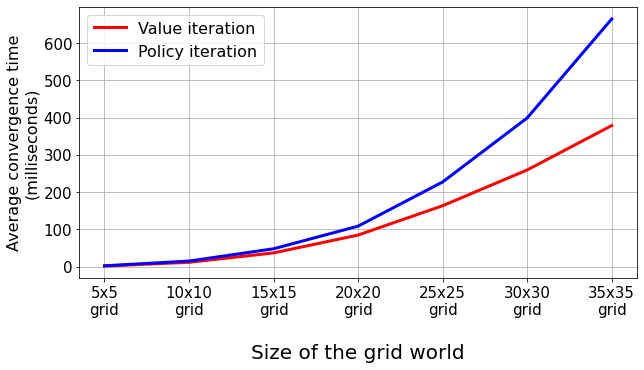

In [235]:
plt.figure (figsize=(10,5))
plt.plot([str(i)+'x'+str(i)+'\ngrid' for i in range(5,36,5)],vi_time,color='red',lw=3)
plt.plot([str(i)+'x'+str(i)+'\ngrid' for i in range(5,36,5)],pi_time,color='blue',lw=3)
plt.legend(["Value iteration","Policy iteration"],fontsize=16)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel("\nSize of the grid world",fontsize=20)
plt.ylabel("Average convergence time\n(milliseconds)",fontsize=16)
plt.grid(True)
plt.show()

In [ ]:
test

In [174]:
##### Variability

In [236]:
vi_iter=[]
pi_iter=[]
for i in range(100):
    _,vi = value_iteration(largeGrid,0.01)
    _,pi = policy_iteration(largeGrid)
    vi_iter.append(vi)
    pi_iter.append(pi)

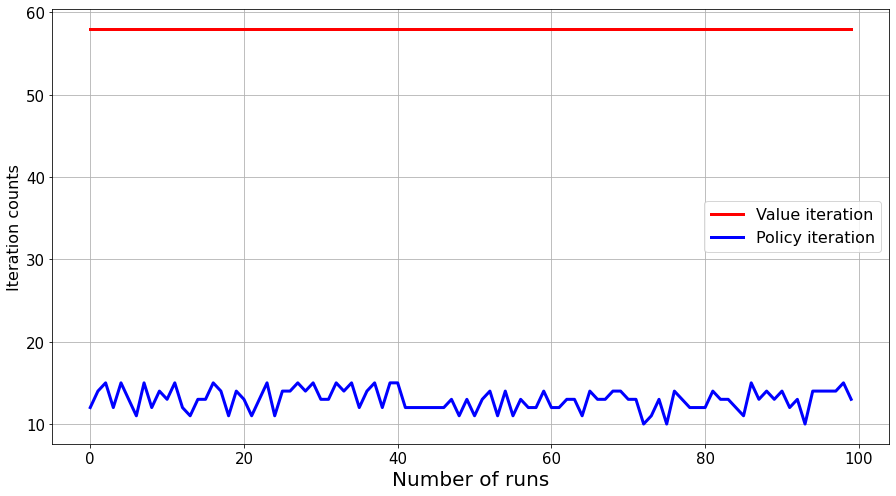

In [240]:
plt.figure (figsize=(15,8))
plt.plot(vi_iter,color='red',lw=3)
plt.plot(pi_iter,color='blue',lw=3)
plt.legend(["Value iteration","Policy iteration"],fontsize=16)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel("Number of runs",fontsize=20)
plt.ylabel("Iteration counts",fontsize=16)
plt.grid(True)
plt.show()

## Qlearning

In [297]:
class QLearningAgent:
    """ An exploratory Q-learning agent. It avoids having to learn the transition
        model because the Q-value of a state can be related directly to those of
        its neighbors.
    """
    def __init__(self, mdp, Ne, Rplus, alpha=None):

        self.gamma = mdp.gamma
        self.terminals = mdp.terminals
        self.all_act = mdp.actlist
        self.Ne = Ne  # iteration limit in exploration function
        self.Rplus = Rplus  # large value to assign before iteration limit
        self.Q = defaultdict(float)
        self.Nsa = defaultdict(float)
        self.s = None
        self.a = None
        self.r = None

        if alpha:
            self.alpha = alpha
        else:
            self.alpha = lambda n: 1./(1+n)

    def f(self, u, n):
        """ Exploration function. Returns fixed Rplus until
        agent has visited state, action a Ne number of times."""
        if n < self.Ne:
            return self.Rplus
        else:
            return u

    def actions_in_state(self, state):
        """ Return actions possible in given state.
            Useful for max and argmax. """
        if state in self.terminals:
            return [None]
        else:
            return self.all_act

    def __call__(self, percept):
        s1, r1 = self.update_state(percept)
        Q, Nsa, s, a, r = self.Q, self.Nsa, self.s, self.a, self.r
        alpha, gamma, terminals = self.alpha, self.gamma, self.terminals,
        actions_in_state = self.actions_in_state

        if s in terminals:
            Q[s, None] = r1
        if s is not None:
            Nsa[s, a] += 1
            Q[s, a] += alpha(Nsa[s, a]) * (r + gamma * max(Q[s1, a1]
                                           for a1 in actions_in_state(s1)) - Q[s, a])
        if s in terminals:
            self.s = self.a = self.r = None
        else:
            self.s, self.r = s1, r1
            self.a = max(actions_in_state(s1), key=lambda a1: self.f(Q[s1, a1], Nsa[s1, a1]))
        return self.a

    def update_state(self, percept):
        """To be overridden in most cases. The default case
        assumes the percept to be of type (state, reward)."""
        return percept

In [300]:
def run_single_trial(agent_program, mdp):
    """Execute trial for given agent_program
    and mdp."""

    def take_single_action(mdp, s, a):
        """
        Select outcome of taking action a
        in state s. Weighted Sampling.
        """
        x = random.uniform(0, 1)
        cumulative_probability = 0.0
        for probability_state in mdp.T(s, a):
            probability, state = probability_state
            cumulative_probability += probability
            if x < cumulative_probability:
                break
        return state

    current_state = mdp.init
    while True:
        current_reward = mdp.R(current_state)
        percept = (current_state, current_reward)
        next_action = agent_program(percept)
        if next_action is None:
            break
        current_state = take_single_action(mdp, current_state, next_action)

In [301]:
# Define an agent
q_agent = QLearningAgent(largeGrid, Ne=10, Rplus=2,alpha=lambda n: 60./(59+n))

In [302]:
run_single_trial(q_agent,largeGrid)

In [303]:
q_agent.Q

defaultdict(float,
            {((0, 0), (1, 0)): -0.01,
             ((0, 0), (0, 1)): 0.0,
             ((0, 0), (-1, 0)): 0.0,
             ((0, 0), (0, -1)): 0.0,
             ((1, 0), (1, 0)): -0.01,
             ((1, 0), (0, 1)): 0.0,
             ((1, 0), (-1, 0)): 0.0,
             ((1, 0), (0, -1)): 0.0,
             ((2, 0), (1, 0)): -0.01,
             ((2, 0), (0, 1)): 0.0,
             ((2, 0), (-1, 0)): 0.0,
             ((2, 0), (0, -1)): 0.0,
             ((3, 0), (1, 0)): -0.01,
             ((3, 0), (0, 1)): 0.0,
             ((3, 0), (-1, 0)): 0.0,
             ((3, 0), (0, -1)): 0.0,
             ((3, 1), None): 0.0})

In [306]:
for i in range(200):
    run_single_trial(q_agent,largeGrid)

In [307]:
q_agent.Q

defaultdict(float,
            {((0, 0), (1, 0)): 0.26140021887725073,
             ((0, 0), (0, 1)): -0.08258469492562989,
             ((0, 0), (-1, 0)): -0.08253470208777046,
             ((0, 0), (0, -1)): -0.08328767694664337,
             ((1, 0), (1, 0)): -0.5337537022448671,
             ((1, 0), (0, 1)): -0.7590981933152107,
             ((1, 0), (-1, 0)): -0.10451751871358728,
             ((1, 0), (0, -1)): 0.22425056889659128,
             ((2, 0), (1, 0)): -0.017714285714285717,
             ((2, 0), (0, 1)): 2.3931450952512985,
             ((2, 0), (-1, 0)): -0.016327999721064454,
             ((2, 0), (0, -1)): -0.06185787703894125,
             ((3, 0), (1, 0)): -0.010000029061932234,
             ((3, 0), (0, 1)): -0.46223952940656543,
             ((3, 0), (-1, 0)): 0.0,
             ((3, 0), (0, -1)): 0.0,
             ((3, 1), None): -0.5616706288938945,
             ((4, 0), (1, 0)): -0.01,
             ((4, 0), (0, 1)): -0.010839683077695906,
             ((4, 0)

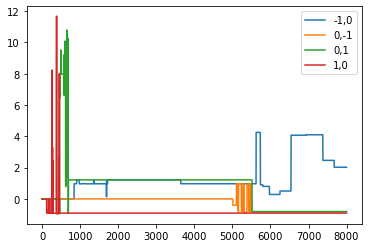

In [309]:
x1=[]
x2=[]
x3=[]
x4=[]

q_agent = QLearningAgent(largeGrid, Ne=40, Rplus=1.5,alpha=lambda n: 5000./(4999+n))
for i in range(8000):
    run_single_trial(q_agent,largeGrid)
    x1.append(q_agent.Q[((2,2),(-1,0))])
    x2.append(q_agent.Q[((2,2),(0,-1))])
    x3.append(q_agent.Q[((2,2),(0,1))])
    x4.append(q_agent.Q[((2,2),(1,0))])

plt.plot(x1)
plt.plot(x2)
plt.plot(x3)
plt.plot(x4)
plt.legend(['-1,0','0,-1','0,1','1,0'])
plt.show()

In [310]:
def get_U_from_Q(q_agent):
    U = defaultdict(lambda: -100.) # Large negative value for comparison
    for state_action, value in q_agent.Q.items():
        state, action = state_action
        if U[state] < value:
                    U[state] = value
    return U

In [315]:
print(get_U_from_Q(q_agent))

defaultdict(<function get_U_from_Q.<locals>.<lambda> at 0x7fc545aaa950>, {(0, 0): 0.10036236858847968, (1, 0): 0.11218791983754964, (2, 0): 0.41354202727652917, (3, 0): 1.190031078927701, (3, 1): -0.6167198622235264, (2, 2): 2.025353062297396, (1, 1): -0.9775145143687242, (4, 0): 2.67299199434636, (5, 0): 3.0930420246036165, (6, 0): 1.695201337859691, (7, 0): 2.3267953570465414, (8, 0): 0.8347603942268359, (9, 0): 0.47333954574874415, (9, 1): 0.8678923674230083, (10, 1): 0.4733322241514679, (11, 1): 0.3131076550928419, (12, 1): 0.2671277042608368, (13, 1): 0.11802323063754562, (14, 1): -0.01, (15, 1): -0.01, (16, 1): -0.01, (17, 1): -0.010000725490415141, (18, 1): -0.010000000000001511, (19, 1): -0.018925034552258673, (20, 1): -0.01, (21, 1): -0.01, (22, 1): -0.01, (23, 1): -0.01, (23, 2): -0.01, (24, 2): -0.01, (24, 3): -0.01, (24, 4): -0.01, (24, 5): -0.01, (24, 1): -0.01, (24, 0): 0.0, (24, 6): -0.01, (24, 7): -0.01, (24, 8): -0.01, (23, 4): -0.01, (24, 9): -0.01, (24, 10): -0.01, (

In [314]:
print(value_iteration(largeGrid,epsilon=0.001))

({(7, 3): 5.34117662124069, (16, 9): 0.7547054473570333, (19, 4): 0.8997921765724395, (17, 20): 0.08348718469998571, (22, 19): 0.010682802558623467, (20, 7): 0.5572688270745295, (18, 19): 0.08346304035801515, (21, 6): 0.5479118728699445, (8, 5): 3.87134536365493, (9, 0): 2.9373308031218195, (10, 7): 2.284274246742707, (11, 22): 0.2064630493089856, (0, 17): 1.0969296027275244, (24, 14): 0.07103035204211115, (14, 1): 1.6766467062821626, (12, 17): 0.41180331909280443, (15, 4): 1.6173753910393078, (13, 20): 0.20642395344166342, (3, 2): -1.0, (4, 5): 6.558242275487437, (5, 24): 0.38302394043462146, (16, 0): 1.1973444481821425, (6, 23): 0.400276510747171, (19, 13): 0.24835041447537182, (17, 13): 0.3502025652585066, (7, 22): 0.4079664976231554, (20, 14): 0.16954652506887102, (18, 10): 0.4817895636690855, (23, 19): -0.0005098908131944135, (21, 15): 0.10865168492139654, (8, 12): 1.5230240426370614, (22, 12): 0.16969086576377276, (9, 9): 1.9977646269518028, (23, 9): 0.2479888259765809, (10, 14):

In [320]:
def qlearning_iter(agent_program,mdp,iterations=1000,print_final_utility=True):
    """
    Function for utility estimate by Q-learning by many iterations
    Returns a history object i.e. a list of dictionaries, where utility estimate for each iteration is stored
    
    q_agent = QLearningAgent(grid_1, Ne=25, Rplus=1.5,
                            alpha=lambda n: 10000./(9999+n))
    hist=qlearning_iter(q_agent,grid_1,iterations=10000)
    
    """
    qhistory=[]
    
    for i in range(iterations):
        run_single_trial(agent_program,mdp)
        U=get_U_from_Q(agent_program)
        if len(U)==len(mdp.states):
            qhistory.append(U)
    
    if print_final_utility:
        print(U)
    return qhistory

In [321]:
def plot_qlearning_vi(hist, vi,plot_n_states=None):
    """
    Compares and plots a Q-learning and value iteration results for the utility estimate of an MDP's states
    hist: A history object from a Q-learning run
    vi: A value iteration estimate for the same MDP
    plot_n_states: Restrict the plotting for n states (randomly chosen)
    """
    utilities={k:[] for k in list(vi[0].keys())}
    for h in hist:
        for state in h.keys():
            utilities[state].append(h[state])
    
    if plot_n_states==None:
        for state in list(vi[0].keys()):
            plt.figure(figsize=(7,4))
            plt.title("Plot of State: {} over Q-learning iterations".format(str(state)),fontsize=16)
            plt.plot(utilities[state])
            plt.hlines(y=vi[0][state],xmin=0,xmax=1.1*len(hist))
            plt.legend(['Q-learning estimates','Value iteration estimate'],fontsize=14)
            plt.xlabel("Iterations",fontsize=14)
            plt.ylabel("Utility of the state",fontsize=14)
            plt.grid(True)
            plt.show()
    else:
        for state in list(vi[0].keys())[:plot_n_states]:
            plt.figure(figsize=(7,4))
            plt.title("Plot of State: {} over Q-learning iterations".format(str(state)),fontsize=16)
            plt.plot(utilities[state])
            plt.hlines(y=vi[0][state],xmin=0,xmax=1.1*len(hist))
            plt.legend(['Q-learning estimates','Value iteration estimate'],fontsize=14)
            plt.xlabel("Iterations",fontsize=14)
            plt.ylabel("Utility of the state",fontsize=14)
            plt.grid(True)
            plt.show()

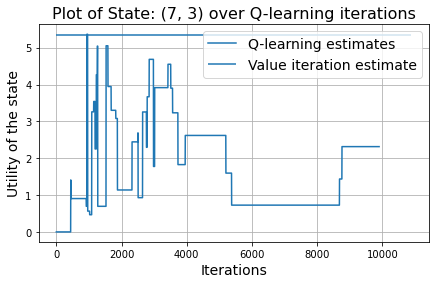

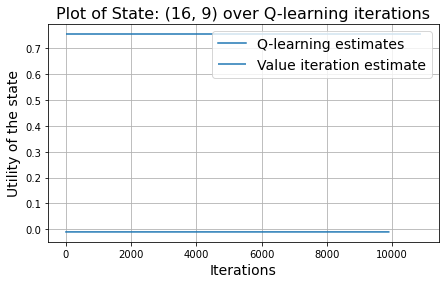

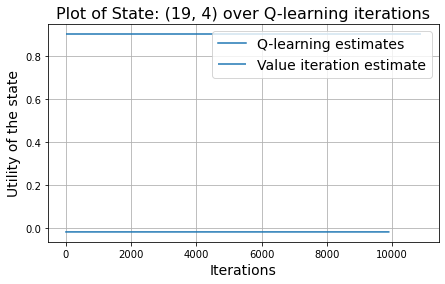

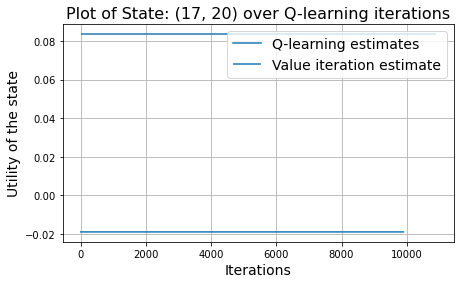

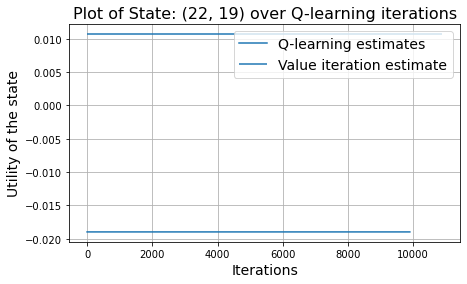

...

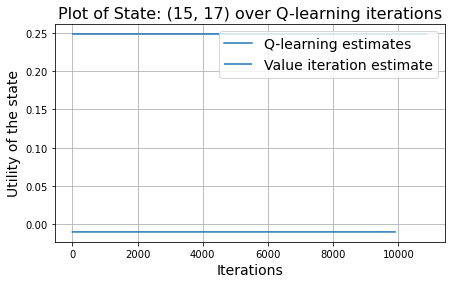

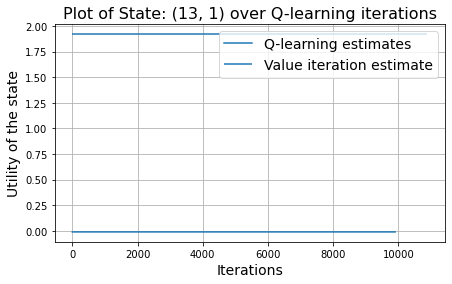

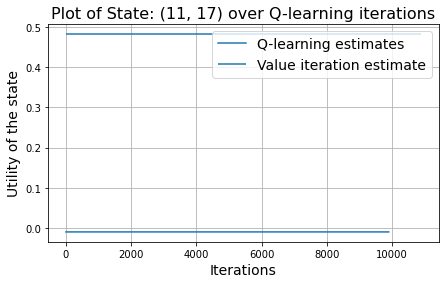

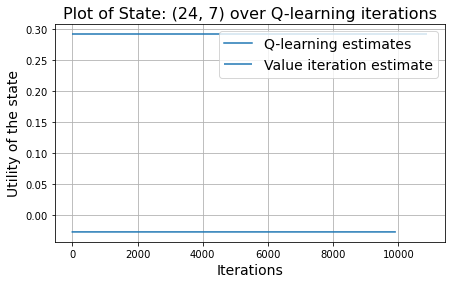

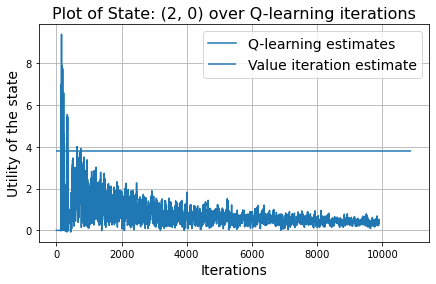

In [325]:
# Define the Q-learning agent
q_agent = QLearningAgent(largeGrid, Ne=20, Rplus=2,alpha=lambda n: 10000/(9999+n))
# Obtain the history by running the Q-learning for many iterations
hist=qlearning_iter(q_agent,largeGrid,iterations=10000,print_final_utility=False)
# Get a value iteration estimate using the same MDP
vi = value_iteration(largeGrid,epsilon=0.001)
# Compare the utility estimates from two methods
plot_qlearning_vi(hist,vi)

